# Assignment 1: Panoramic Image Stitching

## Part 1: 2D Convolution + SIFT

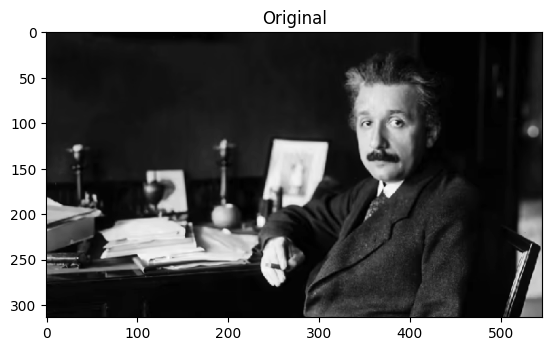

1
sobel [[ 1.  2.  1.]
 [ 0.  0.  0.]
 [-1. -2. -1.]]


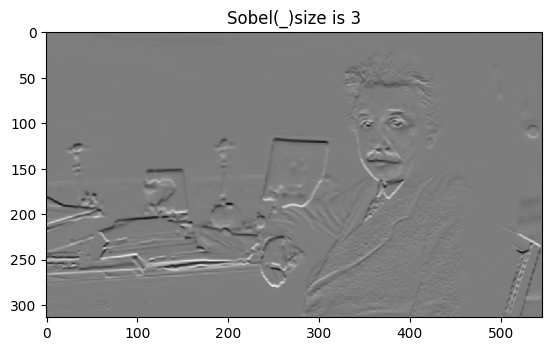

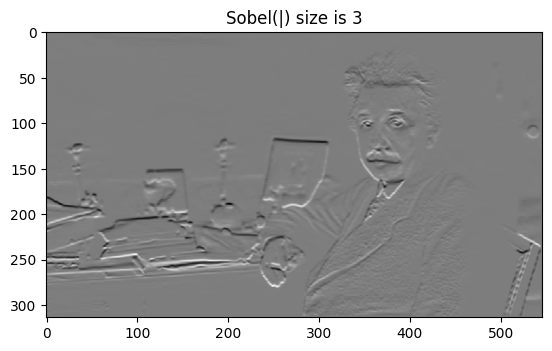

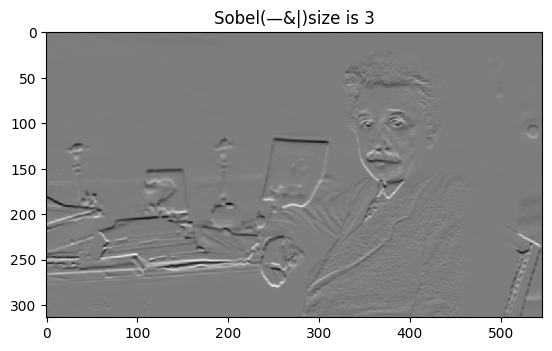

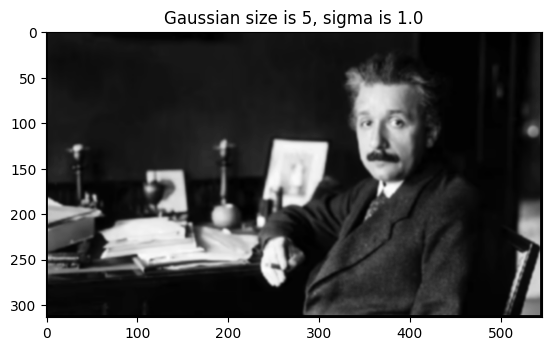

Haar-like Mask 1:
[[ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]]



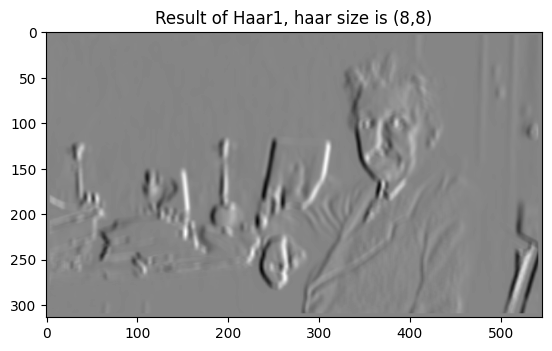

Haar-like Mask 2:
[[ 1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]]



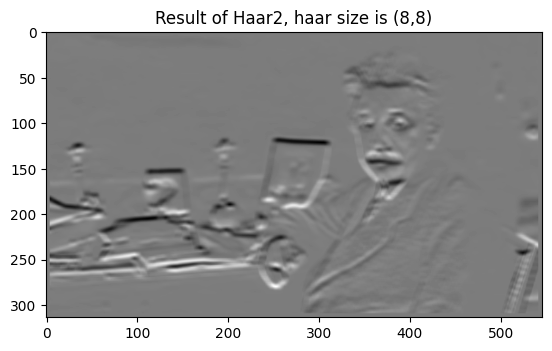

Haar-like Mask 3:
[[ 1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [-1. -1. -1. -1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]
 [ 1.  1.  1.  1.  1.  1.  1.  1.]]



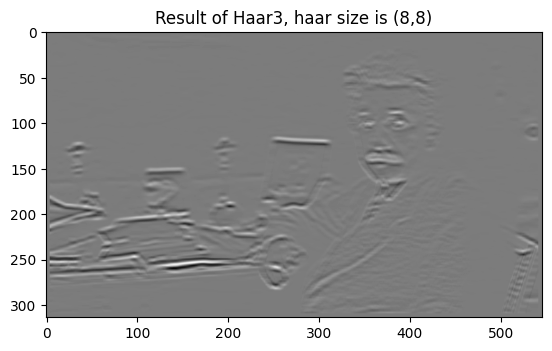

Haar-like Mask 4:
[[ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [ 1.  1.  1.  1. -1. -1. -1. -1.]
 [-1. -1. -1. -1.  1.  1.  1.  1.]
 [-1. -1. -1. -1.  1.  1.  1.  1.]
 [-1. -1. -1. -1.  1.  1.  1.  1.]
 [-1. -1. -1. -1.  1.  1.  1.  1.]]



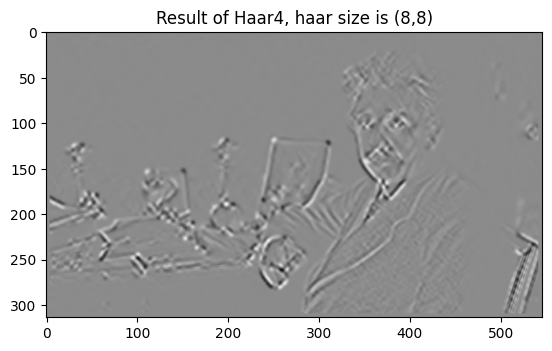

Haar-like Mask 5:
[[0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]
 [0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625 0.015625]]



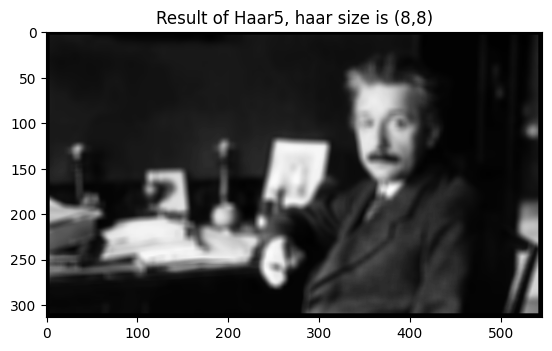

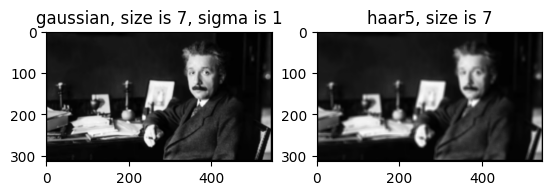

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2

def apply_convolution_normalized(image, kernel):
    image_height, image_width = image.shape
    kernel_height, kernel_width = kernel.shape
    padding_h = kernel_height // 2
    padding_w = kernel_width // 2

    # transform to 0 ~ 1
    image_normalized = image.astype(np.float32) / 255.0

    res = np.zeros_like(image, dtype=np.float32)  # transform to float32

    for y in range(padding_h, image_height - padding_h):
        for x in range(padding_w, image_width - padding_w):
            sum = 0
            for ky in range(kernel_height):
                for kx in range(kernel_width):
                    sum += kernel[ky, kx] * image_normalized[y - padding_h + ky, x - padding_w + kx]
            res[y, x] = sum

    # transform to [0, 255]
    min_val = np.min(res)
    max_val = np.max(res)
    res = (res - min_val) / (max_val - min_val) * 255.0

    # back to uint8
    res = res.astype(np.uint8)
    return res

def generate_sobel_kernel(size): # The generated shape is horizontal 121. If you want to generate vertical 121, you can use the transpose matrix.
    if size % 2 == 0:
        raise ValueError(f"Sobel kernel size must be odd, input size is {size}")

    half_size = size // 2
    print(half_size)
    kernel = np.zeros((size, size))
    
    # Generate Pascal's Triangle
    pascals_triangle = []
    for i in range(size):
        row = [math.comb(i, j) for j in range(i+1)]
        pascals_triangle.append(row)
    
    # Create Sobel kernel using Pascal's Triangle
    for i in range(size):
        for j in range(size):
            if i == half_size :
                kernel[i, j] = 0
            else :
                kernel[i, j] = pascals_triangle[size-1][j] * ( i + 1 if i < half_size else i - size )
    return kernel

def generate_gaussian_kernel(size, sigma):
    if size % 2 == 0:
        raise ValueError(f"Gaussian kernel size must be odd, input size is {size}")
    
    kernel = np.zeros((size, size))
    kernel_center = size // 2

    for i in range(size):
        for j in range(size):
            x = i - kernel_center
            y = j - kernel_center
            kernel[i, j] = math.exp(-(x**2 + y**2) / (2 * sigma**2)) / (2 * math.pi * sigma**2)
    
    # Normalization
    kernel /= np.sum(kernel)
    return kernel

def generate_haar_masks(width, height):
    masks = []

    # Horizontal
    mask1 = np.zeros((height, width))
    mask1[:, :width//2] = 1
    mask1[:, width//2:] = -1
    masks.append(mask1)

    # Vertical
    mask2 = np.zeros((height, width))
    mask2[:height//2, :] = 1
    mask2[height//2:, :] = -1
    masks.append(mask2)

    # Middle
    mask3 = np.zeros((height, width))
    mask3[:height//4, :] = 1
    mask3[height//4:3*(height//4), :] = -1
    mask3[3*(height//4):, :] = 1
    masks.append(mask3)

    # Diagonal
    mask4 = np.zeros((height, width))
    mask4[:height//2, :width//2] = 1
    mask4[height//2:, :width//2] = -1
    mask4[:height//2, width//2:] = -1    
    mask4[height//2:, width//2:] = 1   
    masks.append(mask4)

    # Sum
    mask5 = np.ones((height, width))
    mask5 /= (height * width)
    masks.append(mask5)
    
    return masks

def main():
    image_path = "ein.png"
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    plt.imshow(image, cmap='gray')
    plt.title("Original")
    plt.show()
    
    sobel_size = 3  #Adjust the scale for sobel
    sobel = generate_sobel_kernel(sobel_size)
    print('sobel', sobel)
    result_sobel1 = apply_convolution_normalized(image, sobel)
    plt.title(f"Sobel(_)size is {sobel_size}")
    plt.imshow(result_sobel1, cmap='gray')
    plt.show()

    result_sobel2 = apply_convolution_normalized(image, sobel.T)
    plt.title(f"Sobel(|) size is {sobel_size}")
    plt.imshow(result_sobel1, cmap='gray')
    plt.show()

    result_sobel = cv2.add(result_sobel1, result_sobel2)
    plt.title(f"Sobel(—&|)size is {sobel_size}")
    plt.imshow(result_sobel1, cmap='gray')
    plt.show()

    gaussian_size = 5  #Adjust the scale for gaussian
    gaussian_sigma = 1.0
    gaussian = generate_gaussian_kernel(gaussian_size, gaussian_sigma)

    result_gaussian = apply_convolution_normalized(image, gaussian)
    plt.title(f"Gaussian size is {gaussian_size}, sigma is {gaussian_sigma}")
    plt.imshow(result_gaussian, cmap='gray')
    plt.show()    

    # difine size of Haar-like masks
    width = 8  # 
    height = 8  # 
    haar_masks = generate_haar_masks(width, height)

    for i, mask in enumerate(haar_masks):
        print(f"Haar-like Mask {i+1}:\n{mask}\n")
        result_haar = apply_convolution_normalized(image, mask)
        plt.title(f"Result of Haar{i+1}, haar size is ({width},{height})")
        plt.imshow(result_haar, cmap='gray')
        plt.show()

    #compare gaussian and haar5
    gaussian = generate_gaussian_kernel(7, 1)
    haars = generate_haar_masks(7, 7)
    haar5 = haars[4]
    result_gaussian = apply_convolution_normalized(image, gaussian)
    result_haar5 = apply_convolution_normalized(image, haar5)
    plt.subplot(121)
    plt.title("gaussian, size is 7, sigma is 1")
    plt.imshow(result_gaussian, cmap='gray')
    plt.subplot(122)
    plt.title("haar5, size is (7,7)")
    plt.imshow(result_haar5, cmap='gray')    
    plt.show()

if __name__ == "__main__":
    main()

The sobel kernal and the first four Haars kernal can extract boundary information in different directions to varying degrees. Gaussian kernel and haar5 will blur the details of the image. I made a comparison, the normalized Gaussian kernel (σ=1) will be clearer compared with normalized Haar5.

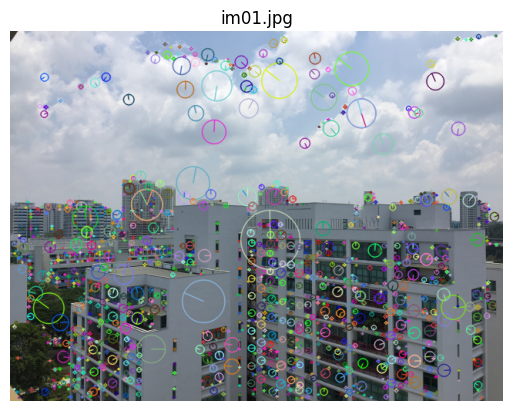

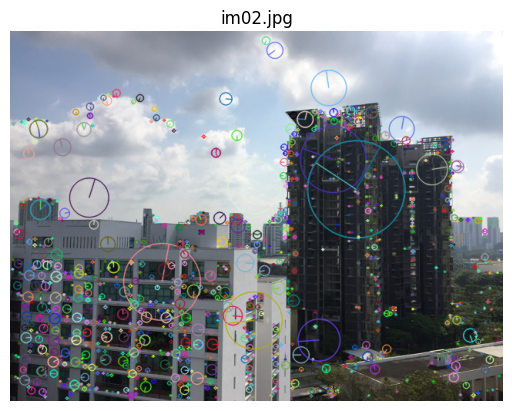

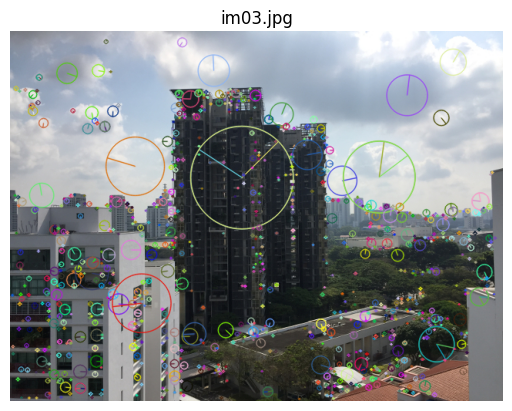

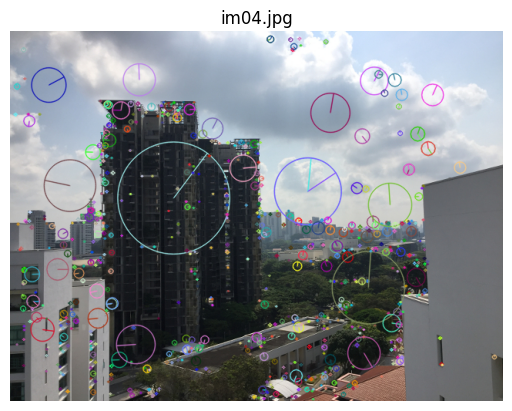

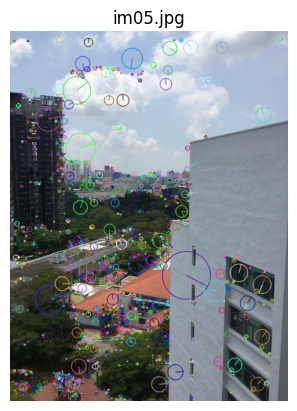

In [19]:
import cv2
import os
import matplotlib.pyplot as plt

# get image path
image_folder = 'assg1'

# get pictures in the folder
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

keypoint_detector = cv2.SIFT_create()

for image_file in image_files:
    # read picture
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)

    # get keypoints
    keypoints = keypoint_detector.detect(image, None)

    # draw keypoints with orientation and size information
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # show pictures
    plt.imshow(cv2.cvtColor(image_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(image_file)
    plt.axis('off')
    plt.show()






## Part 2: Homography

In [53]:
import tkinter as tk
from PIL import Image, ImageTk

# creat main window
root = tk.Tk()
root.title("Please choose four points")

# open image hi.jpg
image = Image.open("h1.jpg")

image_width, image_height = image.size

# set the size of window
window_width = min(image_width, 600)
window_height = min(image_height, 600)

# create a Canvas to listen for click
canvas = tk.Canvas(root, width=window_width, height=window_height)
canvas.grid(row=0, column=0, sticky="nw")

# Use ImageTk.PhotoImage converts the image to a format available to Tkinter and assigns it to a global variable on the Canvas
photo = ImageTk.PhotoImage(image=image)
canvas.photo = photo

# show image in canvas
canvas.create_image(0, 0, anchor=tk.NW, image=photo)

# Add a scrollbar
scrollbar_x = tk.Scrollbar(root, orient=tk.HORIZONTAL)
scrollbar_x.grid(row=1, column=0, sticky="ew")
scrollbar_x.config(command=canvas.xview)

scrollbar_y = tk.Scrollbar(root, orient=tk.VERTICAL)
scrollbar_y.grid(row=0, column=1, sticky="ns")
scrollbar_y.config(command=canvas.yview)

canvas.config(xscrollcommand=scrollbar_x.set, yscrollcommand=scrollbar_y.set)

canvas.config(scrollregion=(0, 0, image_width, image_height))

coordinates = []

# click event
def on_canvas_click(event):
    # Get the coordinates of the clicked point, taking into account the scrolling offset
    x, y = canvas.canvasx(event.x), canvas.canvasy(event.y)
    
    # Add the screen coordinates of the clicked point to the list
    coordinates.append((x, y))
    
    # Draw a small circle to mark the click point
    canvas.create_oval(x - 5, y - 5, x + 5, y + 5, fill="red")
    
    if len(coordinates) == 4:
        for x, y in coordinates:
            # Map the screen coordinates to the original image coordinates and round to the nearest whole number.
            original_x = round((x / window_width) * 600)
            original_y = round((y / window_height) * 600)
            print(f"({original_x}, {original_y})")
        
        # close UI
        root.destroy()

canvas.bind("<Button-1>", on_canvas_click)

# start mainloop
root.mainloop()

(365, 486)
(838, 489)
(724, 846)
(604, 964)


It is troublesome to use tkinter to make UI. I will no longer use tkinter in subsequent operations.

In [45]:
import cv2

img1 = cv2.imread("h1.jpg")

h1_width, h1_height = img1.shape[1], img1.shape[0]

# create a window
cv2.namedWindow("h1", cv2.WINDOW_NORMAL)
cv2.resizeWindow("h1", h1_width, h1_height)

h1_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # print the coordinates
        print(x, y)
        h1_list.append((y, x))
        if len(h1_list) == 4:
            cv2.destroyAllWindows()

# Bind the callback function to the window
cv2.setMouseCallback("h1", on_mouse_click)

# show image
cv2.imshow("h1", img1)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

0 0
1199 4
1 1196
1199 1196


In [46]:
import cv2

img2 = cv2.imread("h2.jpg")

h2_width, h2_height = img2.shape[1], img2.shape[0]

# create a window
cv2.namedWindow("h2", cv2.WINDOW_NORMAL)
cv2.resizeWindow("h2", h2_width, h2_height)

h2_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # print the coordinates
        print(x, y)
        h2_list.append((y, x))##
        if len(h2_list) == 4:
            cv2.destroyAllWindows()
            
# Bind the callback function to the window
cv2.setMouseCallback("h2", on_mouse_click)

# show image
cv2.imshow("h2", img2)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

6 209
469 4
364 578
842 311


If you want to reselect the points, you can re-run the two pieces of code above

In [47]:
print(h1_list, h2_list)

[(0, 0), (4, 1199), (1196, 1), (1196, 1199)] [(209, 6), (4, 469), (578, 364), (311, 842)]


In [48]:
import cv2
import numpy as np

l1 = np.array(h1_list, dtype=np.float32)
l2 = np.array(h2_list, dtype=np.float32)

def estimate_homography(points1, points2):
    if len(points1) < 4 or len(points2) < 4:
        raise ValueError("At least 4 corresponding points are required")

    A = []
    for i in range(len(points1)):
        x1, y1 = points1[i]
        x2, y2 = points2[i]
        A.append([x1, y1, 1, 0, 0, 0, -x1 * x2, -y1 * x2, -x2])
        A.append([0, 0, 0, x1, y1, 1, -x1 * y2, -y1 * y2, -y2])

    A = np.array(A)

    _, _, Vt = np.linalg.svd(A)
    H = Vt[-1].reshape(3, 3)
    H /= H[2, 2]

    return H

# Calculate the homography matrix
H1 = estimate_homography(l1, l2)

# Print the homography matrix
print("Homography Matrix:")
print(H1)

Homography Matrix:
[[ 2.53909906e-01 -1.71488086e-01  2.09000000e+02]
 [ 2.64489410e-01  4.24527964e-01  6.00000000e+00]
 [-9.48140308e-05  8.40161010e-05  1.00000000e+00]]


[[   0    0 1200 1200]
 [   0 1200    0 1200]
 [   1    1    1    1]]
[[209.           3.21429648 513.69188728 307.90618376]
 [  6.         515.43355727 323.38729211 832.82084937]
 [  1.           1.10081932   0.88622316   0.98704248]]
579.6416847632237 2.9199128519011155 843.7538026275477 6.00000000014286
(581, 842, 3)


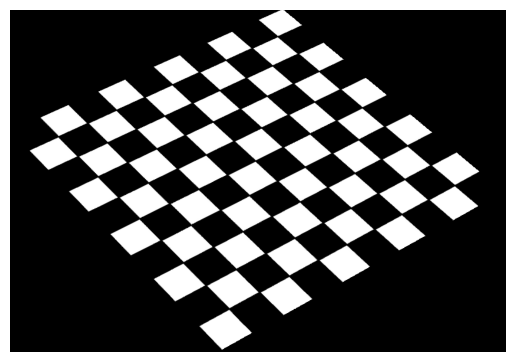

In [74]:
import matplotlib.pyplot as plt

def new_homoed_size(img, H):
    """
    Calculate the size of the image after applying a Homography transformation.

    Args:
        h1 (tuple): Shape of the original image (rows, columns, channels).
        H (numpy.ndarray): Homography matrix.

    Returns:
        tuple: Tuple containing (max_x, min_x, max_y, min_y) of the transformed image.
    """
    rowshape, colshape, _ = img.shape

    # Define the coordinates of the four corners
    top_left = np.array([[0, 0, 1]])
    top_right = np.array([[0, colshape, 1]])
    bottom_left = np.array([[rowshape, 0, 1]])
    bottom_right = np.array([[rowshape, colshape, 1]])

    # Create a matrix of corner coordinates
    corner = np.concatenate((top_left, top_right, bottom_left, bottom_right), axis=0).T
    print(corner)

    # Apply Homography transformation
    transformed_corner = np.dot(H, corner)
    print(transformed_corner)
    
    # Normalize coordinates
    transformed_corner = transformed_corner[0:2, :] / transformed_corner[2, :]

    # Calculate max and min coordinates
    max_x, min_x = np.max(transformed_corner[0, :]), np.min(transformed_corner[0, :])
    max_y, min_y = np.max(transformed_corner[1, :]), np.min(transformed_corner[1, :])

    return max_x, min_x, max_y, min_y

#step means the step during loop
def transfer(img, H, step):
    # Get output size
    max_x, min_x, max_y, min_y = new_homoed_size(img, H)
    print(max_x, min_x, max_y, min_y)
    delta_x, delta_y = max_x - min_x, max_y - min_y
    [row_number, collum_number, c] = img.shape
    
    # Initialize the output image 
    h12h2 = np.zeros([int(delta_x+5), int(delta_y+5), c], dtype=np.uint8)
    
    for r in np.arange(0, row_number, step):
        #print(f'{j/1200:.2%}')
        for c in np.arange(0, collum_number, step):
            px = np.array([[r, c, 1]]).T
            Tp = np.dot(H, px)
            
            # Normalize and move the image to the central
            x = int(round(Tp[0, 0] / Tp[2, 0] - min_x))
            y = int(round(Tp[1, 0] / Tp[2, 0] - min_y))
            r = int(round(r))
            c = int(round(c))
            if r == img.shape[0]:
                r = r-1
            if c == img.shape[1]:
                c = c-1
            h12h2[x, y] = img[r, c]

    return h12h2

my_h1toh2 = transfer(img1, H1, 1)
print(my_h1toh2.shape)

plt.imshow(cv2.cvtColor(my_h1toh2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Homography Matrix2:
[[ 2.76870805e+00  1.23440504e+00 -5.86066413e+02]
 [-1.73072577e+00  1.78732270e+00  3.50997749e+02]
 [ 4.07921201e-04 -3.31249671e-05  1.00000000e+00]]
[[  0   0 587 587]
 [  0 850   0 850]
 [  1   1   1   1]]
[[-5.86066413e+02  4.63177873e+02  1.03916521e+03  2.08840950e+03]
 [ 3.50997749e+02  1.87022205e+03 -6.64938275e+02  8.54286024e+02]
 [ 1.00000000e+00  9.71843778e-01  1.23944975e+00  1.21129352e+00]]
1724.1151371626306 -586.06641270169 1924.4060518749889 -536.4786092860803


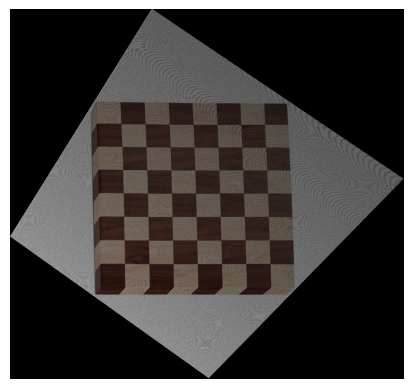

In [65]:
# Calculate the homography matrix
H2 = estimate_homography(l2, l1)

# Print the homography matrix
print("Homography Matrix2:")
print(H2)

h2toh1 = transfer(img2, H2, 0.1)

plt.imshow(cv2.cvtColor(h2toh1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

The image is darker because during mapping, because the pixels are integers and the mapping result is rounded, some points cannot be mapped to numerical values. So I replaced the unmapped image with the surrounding points that were mapped to.

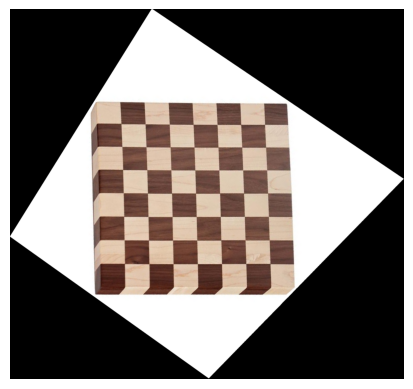

In [76]:
def replace_black_pixels_with_mean(image):
    height, width, channels = image.shape
    result_image = image.copy()

    for y in range(1, height - 1):
        for x in range(1, width - 1):
            # Check if the current pixel is black (0) in all channels
            if np.all(image[y, x] == [0, 0, 0]):
                # Extract the neighborhood (3x3 window) around the current pixel
                neighborhood = image[y - 1:y + 2, x - 1:x + 2]

                # Calculate the mean of non-black pixels in the neighborhood for each channel
                for channel in range(channels):
                    non_black_pixels = neighborhood[:, :, channel][neighborhood[:, :, channel] != 0]
                    if len(non_black_pixels) > 0:
                        mean_value = np.mean(non_black_pixels)
                        result_image[y, x, channel] = mean_value

    return result_image

# Load your color image here
color_image = h2toh1

# Replace black pixels with the mean of non-black pixels
result_image = replace_black_pixels_with_mean(color_image)

plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def estimate_homography(points1, points2):
    if len(points1) < 4 or len(points2) < 4:
        raise ValueError("At least 4 corresponding points are required")

    A = []
    for i in range(len(points1)):
        x1, y1 = points1[i]
        x2, y2 = points2[i]
        A.append([x1, y1, 1, 0, 0, 0, -x1 * x2, -y1 * x2, -x2])
        A.append([0, 0, 0, x1, y1, 1, -x1 * y2, -y1 * y2, -y2])

    A = np.array(A)

    _, _, Vt = np.linalg.svd(A)
    H = Vt[-1].reshape(3, 3)
    H /= H[2, 2]

    return H

img1 = cv2.imread("simpsons.jpg")
img2 = cv2.imread("bus.jpg")

h1_width, h1_height = img1.shape[1], img1.shape[0]

# create a window
cv2.namedWindow("simpsons", cv2.WINDOW_NORMAL)
cv2.resizeWindow("simpsons", h1_width, h1_height)

simpsons_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # print the coordinates
        simpsons_list.append((y, x))
        if len(simpsons_list) == 4:
            cv2.destroyAllWindows()

# Bind the callback function to the window
cv2.setMouseCallback("simpsons", on_mouse_click)

# show image
cv2.imshow("simpsons", img1)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

h2_width, h2_height = img2.shape[1], img2.shape[0]

# create a window
cv2.namedWindow("bus", cv2.WINDOW_NORMAL)
cv2.resizeWindow("bus", h2_width, h2_height)

bus_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        bus_list.append((y, x))
        if len(bus_list) == 4:
            cv2.destroyAllWindows()
            
# Bind the callback function to the window
cv2.setMouseCallback("bus", on_mouse_click)

# show image
cv2.imshow("bus", img2)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

MatrixSim = np.array(simpsons_list, dtype=np.float32)
MatrixBus = np.array(bus_list, dtype=np.float32)
print(simpsons_list, bus_list)

# Calculate the homography matrix
H = estimate_homography(MatrixSim, MatrixBus)
print(H)

[(1, 0), (1, 998), (1411, 0), (1410, 999)] [(205, 582), (226, 799), (519, 594), (473, 808)]
[[2.24019164e-01 8.23739975e-02 2.04776504e+02]
 [1.00254868e-02 4.34267972e-01 5.81991459e+02]
 [2.55021340e-06 2.71379910e-04 1.00000000e+00]]


[[   0    0 1500 1500]
 [   0 1000    0 1000]
 [   1    1    1    1]]
[[2.04776504e+02 2.87150501e+02 5.40805250e+02 6.23179247e+02]
 [5.81991459e+02 1.01625943e+03 5.97029689e+02 1.03129766e+03]
 [1.00000000e+00 1.27137991e+00 1.00382532e+00 1.27520523e+00]]
538.7443801230932 204.77650362961413 808.7307335920614 581.9914587373629


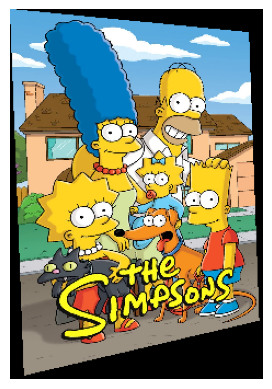

In [9]:
def new_homoed_size(img, H):
    """
    Calculate the size of the image after applying a Homography transformation.

    Args:
        h1 (tuple): Shape of the original image (rows, columns, channels).
        H (numpy.ndarray): Homography matrix.

    Returns:
        tuple: Tuple containing (max_x, min_x, max_y, min_y) of the transformed image.
    """
    rowshape, colshape, _ = img.shape

    # Define the coordinates of the four corners
    top_left = np.array([[0, 0, 1]])
    top_right = np.array([[0, colshape, 1]])
    bottom_left = np.array([[rowshape, 0, 1]])
    bottom_right = np.array([[rowshape, colshape, 1]])

    # Create a matrix of corner coordinates
    corner = np.concatenate((top_left, top_right, bottom_left, bottom_right), axis=0).T
    print(corner)

    # Apply Homography transformation
    transformed_corner = np.dot(H, corner)
    print(transformed_corner)
    
    # Normalize coordinates
    transformed_corner = transformed_corner[0:2, :] / transformed_corner[2, :]

    # Calculate max and min coordinates
    max_x, min_x = np.max(transformed_corner[0, :]), np.min(transformed_corner[0, :])
    max_y, min_y = np.max(transformed_corner[1, :]), np.min(transformed_corner[1, :])

    return max_x, min_x, max_y, min_y

def transfer(img, H, step):
    # Get output size
    max_x, min_x, max_y, min_y = new_homoed_size(img, H)
    print(max_x, min_x, max_y, min_y)
    delta_x, delta_y = max_x - min_x, max_y - min_y
    [row_number, collum_number, c] = img.shape
    
    # Initialize the output image 
    h12h2 = np.zeros([int(delta_x+5), int(delta_y+5), c], dtype=np.uint8)
    
    for r in np.arange(0, row_number, step):
        #print(f'{j/1200:.2%}')
        for c in np.arange(0, collum_number, step):
            px = np.array([[r, c, 1]]).T
            Tp = np.dot(H, px)
            
            # Normalize and move the image to the central
            x = int(round(Tp[0, 0] / Tp[2, 0] - min_x))
            y = int(round(Tp[1, 0] / Tp[2, 0] - min_y))
            r = int(round(r))
            c = int(round(c))
            if r == img.shape[0]:
                r = r-1
            if c == img.shape[1]:
                c = c-1
            h12h2[x, y] = img[r, c]

    return h12h2, round(min_x), round(min_y)

Sim2Bus, min_x, min_y = transfer(img1, H, 1)

#Lighted_Sim2Bus = 

plt.imshow(cv2.cvtColor(Sim2Bus, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [10]:
print(min_x, min_y)

205 582


In [21]:
# create a mask，non-black part defined True，black part defined False
mask = Sim2Bus[:, :, 0] != 0
print(mask.shape)
heightS, widthS = mask.shape

(338, 231)


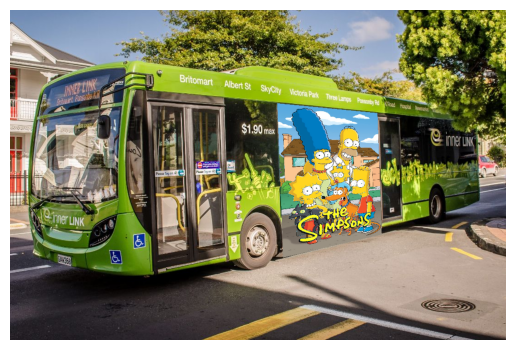

In [20]:
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            img2[min_x+x, min_y+y] = Sim2Bus[x, y]        

plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## Part 3: Manual Homography + Sticthing

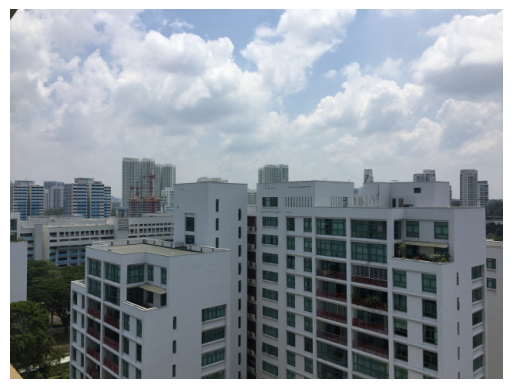

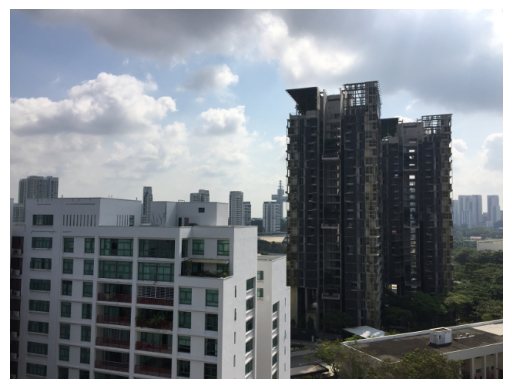

569 328
576 570
627 327
670 553
297 28
298 287
364 26
385 271


In [59]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Path to the images folder relative to the current directory
image_folder = "assg1"

# check the folder
if os.path.exists(image_folder) and os.path.isdir(image_folder):
    # get all files in the folder
    image_files = [file for file in os.listdir(image_folder) if file.endswith((".jpg"))]

image_file = image_files[0]
image_path = os.path.join(image_folder, image_file)
image1 = cv2.imread(image_path)
plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

image_file = image_files[1]
image_path = os.path.join(image_folder, image_file)
image2 = cv2.imread(image_path)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

new_width = image1.shape[1] + 750 
new_height = image1.shape[0] + 600 

# black image
new_image1 = np.zeros((new_height, new_width, 3), dtype=np.uint8)

##extend image1
# copy orriginal image
x_offset = 0
y_offset = (new_height - image1.shape[0]) // 2
new_image1[y_offset:y_offset+image1.shape[0], x_offset:x_offset+image1.shape[1]] = image1
image1 = new_image1

i1_width, i1_height = image1.shape[1], image1.shape[0]

# create a window
cv2.namedWindow("image1", cv2.WINDOW_NORMAL)
cv2.resizeWindow("image1", i1_width, i1_height)

image1_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # print the coordinates
        print(y, x)
        image1_list.append((y, x))
        if len(image1_list) == 4:
            cv2.destroyAllWindows()

# Bind the callback function to the window
cv2.setMouseCallback("image1", on_mouse_click)

# show image
cv2.imshow("image1", image1)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

i2_width, i2_height = image2.shape[1], image2.shape[0]

# create a window
cv2.namedWindow("image2", cv2.WINDOW_NORMAL)
cv2.resizeWindow("image2", i2_width, i2_height)

image2_list = []

# click event
def on_mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        # print the coordinates
        print(y, x)
        image2_list.append((y, x))
        if len(image2_list) == 4:
            cv2.destroyAllWindows()
            
# Bind the callback function to the window
cv2.setMouseCallback("image2", on_mouse_click)

# show image
cv2.imshow("image2", image2)

# close window
cv2.waitKey(0)
cv2.destroyAllWindows()

[(297, 28), (298, 287), (364, 26), (385, 271)] [(569, 328), (576, 570), (627, 327), (670, 553)]
[[ 8.16527531e-01 -4.34412888e-01  3.19928680e+02]
 [-4.98037317e-03  4.50998340e-01  3.06056499e+02]
 [-3.59595927e-05 -7.93954598e-04  1.00000000e+00]]
[[ 319.92868019   85.19428283  724.3648704   914.0959116 ]
 [ 306.05649861 1209.05234278  308.99943655 1247.98632105]]
maxcorner 914.0959116025 85.19428283069122 1247.9863210531025 306.05649860965525


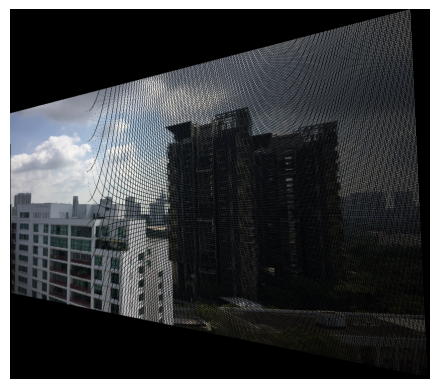

In [61]:
def new_homoed_size(img, H):
    rowshape, colshape, _ = img.shape

    # Define the coordinates of the four corners
    top_left = np.array([[0, 0, 1]])
    top_right = np.array([[0, colshape, 1]])
    bottom_left = np.array([[rowshape, 0, 1]])
    bottom_right = np.array([[rowshape, colshape, 1]])

    # Create a matrix of corner coordinates
    corner = np.concatenate((top_left, top_right, bottom_left, bottom_right), axis=0).T

    # Apply Homography transformation
    transformed_corner = np.dot(H, corner)
    
    # Normalize coordinates
    transformed_corner = transformed_corner[0:2, :] / transformed_corner[2, :]
    print(transformed_corner)

    # Calculate max and min coordinates
    max_x, min_x = np.max(transformed_corner[0, :]), np.min(transformed_corner[0, :])
    max_y, min_y = np.max(transformed_corner[1, :]), np.min(transformed_corner[1, :])

    return max_x, min_x, max_y, min_y

def transfer(img, H, step):
    # Get output size
    max_x, min_x, max_y, min_y = new_homoed_size(img, H)
    print("maxcorner", max_x, min_x, max_y, min_y)
    delta_x, delta_y = max_x - min_x, max_y - min_y
    [row_number, collum_number, c] = img.shape
    
    # Initialize the output image 
    h12h2 = np.zeros([int(delta_x+5), int(delta_y+5), c], dtype=np.uint8)
    
    for r in np.arange(0, row_number, step):
        #print(f'{j/1200:.2%}')
        for c in np.arange(0, collum_number, step):
            px = np.array([[r, c, 1]]).T
            Tp = np.dot(H, px)
            
            # Normalize and move the image to the central
            x = int(round(Tp[0, 0] / Tp[2, 0] - min_x))
            y = int(round(Tp[1, 0] / Tp[2, 0] - min_y))
            r = int(round(r))
            c = int(round(c))
            if r == img.shape[0]:
                r = r-1
            if c == img.shape[1]:
                c = c-1
            h12h2[x, y] = img[r, c]

    return h12h2, round(min_x), round(min_y)

# Calculate the homography matrix
print(image2_list, image1_list)
H = estimate_homography(image2_list, image1_list)
print(H)

i2toi1, min_x, min_y = transfer(image2, H, 1)

plt.imshow(cv2.cvtColor(i2toi1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

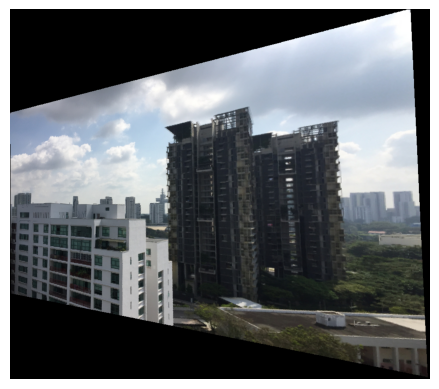

In [62]:
def replace_black_pixels_with_mean(image):
    height, width, channels = image.shape
    result_image = image.copy()

    for y in range(1, height - 1):
        for x in range(1, width - 1):
            # Check if the current pixel is black (0) in all channels
            if np.all(image[y, x] == [0, 0, 0]):
                # Extract the neighborhood (3x3 window) around the current pixel
                neighborhood = image[y - 1:y + 2, x - 1:x + 2]

                # Calculate the mean of non-black pixels in the neighborhood for each channel
                for channel in range(channels):
                    non_black_pixels = neighborhood[:, :, channel][neighborhood[:, :, channel] != 0]
                    if len(non_black_pixels) > 0:
                        mean_value = np.mean(non_black_pixels)
                        result_image[y, x, channel] = mean_value

    return result_image

i2toi1 = replace_black_pixels_with_mean(i2toi1)

plt.imshow(cv2.cvtColor(i2toi1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

(833, 946)


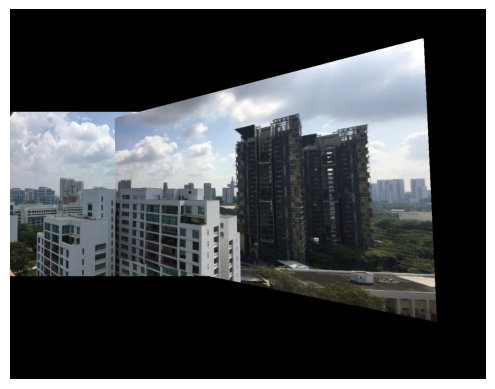

In [67]:
# create a mask，non-black part defined True，black part defined False
mask1 = i2toi1[:, :, 0] != 0
mask2 = image1[:, :, 0] != 0
print(mask.shape)
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            if np.all(image1[min_x+x, min_y+y] == 0):
                image1[min_x+x, min_y+y] = i2toi1[x, y]
            else:
                image1[min_x+x, min_y+y] = image1[min_x+x, min_y+y]/2 + i2toi1[x, y]/2

plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

Add two images. The addition rule is: if both points are black, it is black; if one is black, it is a non-black pixel value; if both points are non-black, it is the average of the two.

There is an effect of double edges because the two images were taken from different angles, so the information contained in the images themselves will be different. For example, an image taken from the front will not contain information about the side of the object, but slightly changing the angle will contain information about the side.

## Part 4: Homography + RANSAC

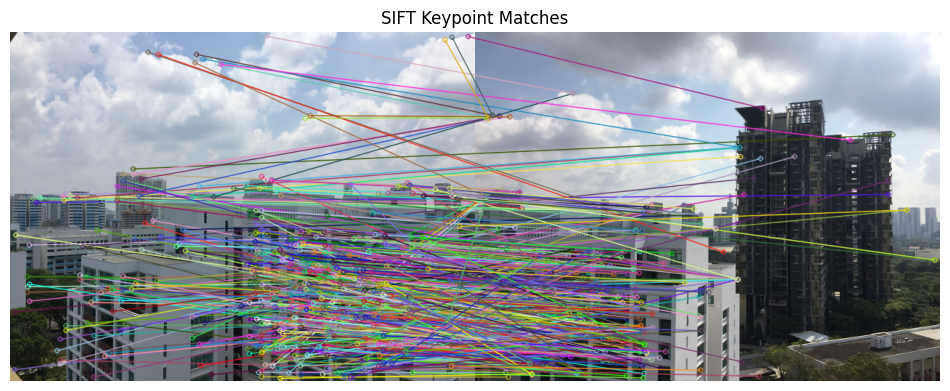

In [117]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img1 = cv2.imread('assg1/im01.jpg')
img2 = cv2.imread('assg1/im02.jpg')

# Create SIFT objects
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(img1, None)
kp2, des2 = sift.detectAndCompute(img2, None)

# difine distance
def my_distance(descriptor1, descriptor2):
    return np.linalg.norm(descriptor1 - descriptor2)

def mini_square(des1, des2):
    # Initialize the matching result list
    matches = []
    
    # Get the number of feature points
    p1, _ = des1.shape
    p2, _ = des2.shape

    # Calculate the distance between two sets of feature points
    distance_matrix = np.zeros((p1, p2))
    for i in range(p1):
        for j in range(p2):
            v = my_distance(des1[i], des2[j])
            distance_matrix[i, j] = v

    # Find the best match
    for i in range(p1):
        # Find the index with the smallest distance
        pos = np.argmin(distance_matrix[i])
        # Calculate distance, note conversion to integer
        distance = int(distance_matrix[i, pos])
        # Store matching results
        matches.append(cv2.DMatch(_distance=distance, _queryIdx=i, _trainIdx=pos, _imgIdx=0))        
    return matches

matches = mini_square(des1, des2)

# Apply ratio test
good_matches = []
for m in matches:
    first, second = matches[m.queryIdx], matches[m.trainIdx]
    if first.distance < 0.75 * second.distance:
        good_matches.append(first)

# Draw matches on the images
matched_img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the matched image
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoint Matches')
plt.axis('off')
plt.show()

num_points 526
[[ 2.89332671e-03  5.63854750e-04 -2.49821988e-01]
 [-1.11113208e-04  3.26406639e-03 -9.68280418e-01]
 [ 1.76264008e-07  2.22665431e-06  1.62801115e-03]]


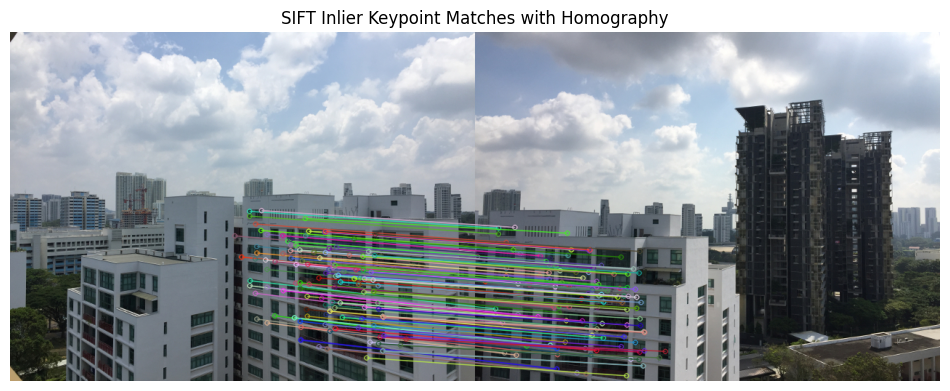

In [69]:
# Get the coordinates of the matching point
src_points = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
dst_points = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
src_points[:, [0, 1]] = src_points[:, [1, 0]]
dst_points[:, [0, 1]] = dst_points[:, [1, 0]]
#print(src_points)

def getH(src, dst, ransac_threshold=4.0, ransac_iterations=2000, numberofpoint4homography = 5):
    """
    Args:
        src (numpy.ndarray): Source points, an Nx2 matrix.
        dst (numpy.ndarray): Destination points, an Nx2 matrix.
        ransac_threshold (float): RANSAC inlier threshold.
        ransac_iterations (int): Number of RANSAC iterations.

    Returns:
        numpy.ndarray: The 3x3 perspective transformation matrix.
        numpy.ndarray: Boolean mask indicating inliers.
    """
    num_points = src.shape[0]
    print('num_points',num_points)

    best_H = None
    best_inlier_mask = np.zeros(num_points, dtype=bool)
    best_inlier_count = 0

    for _ in range(ransac_iterations):
        random_indices = np.random.choice(num_points, numberofpoint4homography, replace=False)
        random_src_pts = src[random_indices]
        random_dst_pts = dst[random_indices]

        A = np.zeros((numberofpoint4homography*2, 9))
        for i in range(numberofpoint4homography):
            x, y = random_src_pts[i, 0], random_src_pts[i, 1]
            u, v = random_dst_pts[i, 0], random_dst_pts[i, 1]
            #print(x,y)
            A[i * 2, :] = [-x, -y, -1, 0, 0, 0, x * u, y * u, u]
            A[i * 2 + 1, :] = [0, 0, 0, -x, -y, -1, x * v, y * v, v]

        # Solve the linear system of equations to find the transformation matrix
        _, _, Vt = np.linalg.svd(A)
        H = Vt[-1].reshape(3, 3)
        #print(H)

        # Calculate inliers
        transformed_src_pts = np.dot(H, np.vstack((src.T, np.ones(num_points))))
        #print(transformed_src_pts.shape)
        transformed_src_pts /= transformed_src_pts[2, :]
        errors = np.linalg.norm(transformed_src_pts[:2, :].T - dst, axis=1)
        inlier_mask = errors < ransac_threshold
        inlier_count = np.count_nonzero(inlier_mask)

        if inlier_count > best_inlier_count:
            best_H = H
            best_inlier_mask = inlier_mask
            best_inlier_count = inlier_count

    return best_H, best_inlier_mask

# Compute optimal homography matrix using RANSAC
H, mask = getH(src_points, dst_points)
print(H)

# mark interior points
inlier_matches = [m for i, m in enumerate(good_matches) if mask[i] == 1]

# Draw interior point matches
matched_img = cv2.drawMatches(img1, kp1, img2, kp2, inlier_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# 显示内点匹配图像
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title('SIFT Inlier Keypoint Matches with Homography')
plt.axis('off')
plt.show()

img.shape (480, 640, 3)
corner [[  0   0 480 480]
 [  0 640   0 640]
 [  1   1   1   1]]
maxcorner 665.0490151553117 -153.4522584268752 367.0803826086339 -596.5223021003447
row_number 480 collum_number 640


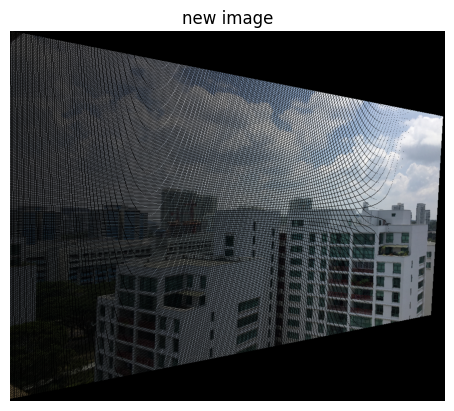

In [82]:
def new_homoed_size(img, H):
    """
    Calculate the size of the image after applying a Homography transformation.

    Args:
        h1 (tuple): Shape of the original image (rows, columns, channels).
        H (numpy.ndarray): Homography matrix.

    Returns:
        tuple: Tuple containing (max_x, min_x, max_y, min_y) of the transformed image.
    """
    rowshape, colshape, _ = img.shape

    # Define the coordinates of the four corners
    top_left = np.array([[0, 0, 1]])
    top_right = np.array([[0, colshape, 1]])
    bottom_left = np.array([[rowshape, 0, 1]])
    bottom_right = np.array([[rowshape, colshape, 1]])
    print('img.shape', img.shape)

    # Create a matrix of corner coordinates
    corner = np.concatenate((top_left, top_right, bottom_left, bottom_right), axis=0).T
    print('corner', corner)

    # Apply Homography transformation
    transformed_corner = np.dot(H, corner)
    #print(transformed_corner)
    
    # Normalize coordinates
    transformed_corner = transformed_corner[0:2, :] / transformed_corner[2, :]

    # Calculate max and min coordinates
    max_x, min_x = np.max(transformed_corner[0, :]), np.min(transformed_corner[0, :])
    max_y, min_y = np.max(transformed_corner[1, :]), np.min(transformed_corner[1, :])

    return max_x, min_x, max_y, min_y

def transfer(img, H, step):
    # Get output size
    max_x, min_x, max_y, min_y = new_homoed_size(img, H)
    print("maxcorner", max_x, min_x, max_y, min_y)
    delta_x, delta_y = max_x - min_x, max_y - min_y
    [row_number, collum_number, c] = img.shape
    print('row_number',row_number, 'collum_number', collum_number)
    
    # Initialize the output image 
    h12h2 = np.zeros([int(delta_x+5), int(delta_y+5), c], dtype=np.uint8)
    
    for r in np.arange(0, row_number, step):
        for c in np.arange(0, collum_number, step):
            px = np.array([[r, c, 1]]).T
            Tp = np.dot(H, px)
            
            # Normalize and move the image to the central
            x = int(round(Tp[0, 0] / Tp[2, 0] - min_x))
            y = int(round(Tp[1, 0] / Tp[2, 0] - min_y))
            r = int(round(r))
            c = int(round(c))
            if r == img.shape[0]:
                r = r-1
            if c == img.shape[1]:
                c = c-1
            h12h2[x, y] = img[r, c]

    return h12h2, round(min_x), round(min_y), round(max_x), round(max_y)

i12i2, min_x, min_y, max_x, max_y = transfer(img1, H, 1)

plt.imshow(cv2.cvtColor(i12i2, cv2.COLOR_BGR2RGB))
plt.title('new image')
plt.axis('off')
plt.show()

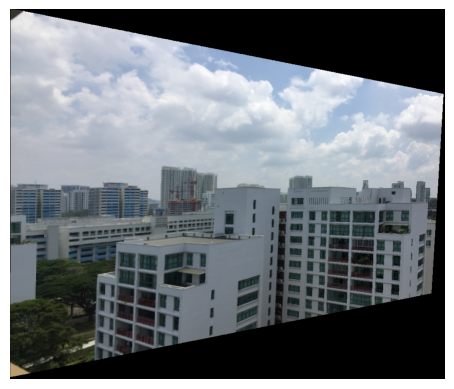

In [83]:
def replace_black_pixels_with_mean(image):
    height, width, channels = image.shape
    result_image = image.copy()

    for y in range(1, height - 1):
        for x in range(1, width - 1):
            # Check if the current pixel is black (0) in all channels
            if np.all(image[y, x] == [0, 0, 0]):
                # Extract the neighborhood (3x3 window) around the current pixel
                neighborhood = image[y - 1:y + 2, x - 1:x + 2]

                # Calculate the mean of non-black pixels in the neighborhood for each channel
                for channel in range(channels):
                    non_black_pixels = neighborhood[:, :, channel][neighborhood[:, :, channel] != 0]
                    if len(non_black_pixels) > 0:
                        mean_value = np.mean(non_black_pixels)
                        result_image[y, x, channel] = mean_value

    return result_image

i12i2 = replace_black_pixels_with_mean(i12i2)

plt.imshow(cv2.cvtColor(i12i2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

min_x -153 min_y -597 max_x 665 max_y 367
delta 818 1237
(823, 1242, 3)
y_start 597
y_end 1237


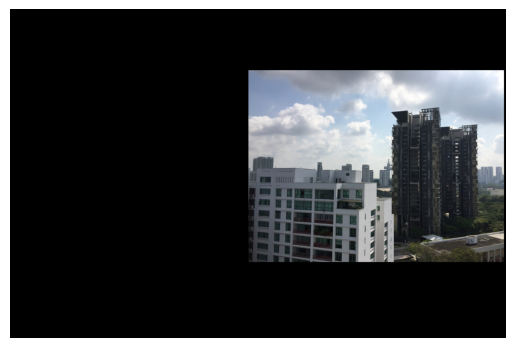

(823, 968)


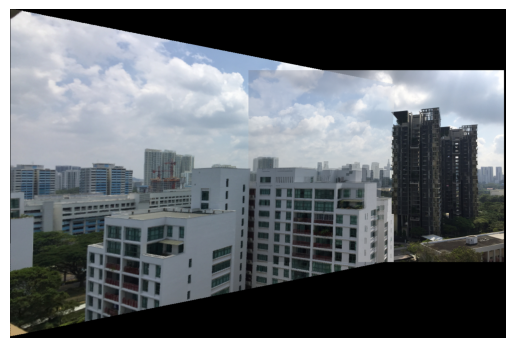

In [116]:
print('min_x', min_x, 'min_y', min_y, 'max_x', max_x, 'max_y', max_y)

# Calculate canvas size
delta_x = totalXmax - totalXmin
delta_y = totalYmax - totalYmin
print('delta', delta_x, delta_y)
res_img = np.zeros((delta_x, delta_y, 3), dtype=np.uint8)# channel = 3

# create a mask，non-black part defined True，black part defined False
mask1 = i12i2[:, :, 0] != 0

def expand_image(img, min_x, min_y, max_x, max_y):
    """
    Args:
        img (numpy.ndarray): Input image.
        min_x (int): Minimum x-coordinate (may be negative).
        min_y (int): Minimum y-coordinate (may be negative).
        max_x (int): Maximum x-coordinate.
        max_y (int): Maximum y-coordinate.

    Returns:
        numpy.ndarray: Expanded image with black-filled area.
    """
    # Get the original image dimensions
    img_height, img_width = img.shape[0], img.shape[1]

    # Determine the new dimensions
    new_height = max(max_x, img_height)
    new_width = max(max_y, img_width)

    if min_x < 0:
        new_width -= min_y
    if min_y < 0:
        new_height -= min_x

    # Create an empty expanded image with black color
    expanded_img = np.zeros((new_height+5, new_width+5, img.shape[2]), dtype=np.uint8)
    print(expanded_img.shape)
    # Calculate the region where the original image will be placed
    x_start = max(0, -min_x)
    y_start = max(0, -min_y)
    print('y_start', y_start)

    x_end = x_start + img_height
    y_end = y_start + img_width
    print('y_end', y_end)
    # Place the original image in the expanded image
    expanded_img[x_start:x_end, y_start:y_end] = img

    return expanded_img

expended_image2 = expand_image(img2, min_x, min_y, max_x, max_y)
plt.imshow(cv2.cvtColor(exp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


mask = i12i2[:, :, 0] != 0
print(mask.shape)
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            if np.all(expended_image2[x, y] == 0):
                expended_image2[x, y] = i12i2[x, y]
            else:
                expended_image2[x, y] = expended_image2[x, y]/2 + i12i2[x, y]/2
                
plt.imshow(cv2.cvtColor(expended_image2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [146]:
H2, mask2 = getH(dst_points, src_points)

num_points 526


In [147]:
i22i1, min_x, min_y, max_x, max_y = transfer(img2, H2, 1)
print(min_x, min_y, max_x, max_y)

img.shape (480, 640, 3)
corner [[  0   0 480 480]
 [  0 640   0 640]
 [  1   1   1   1]]
maxcorner 609.6646787397653 -400.229484636225 1475.6570725688443 292.0155790646188
row_number 480 collum_number 640
-400 292 610 1476


In [148]:
i22i1 = replace_black_pixels_with_mean(i22i1)
i22i1 = replace_black_pixels_with_mean(i22i1)

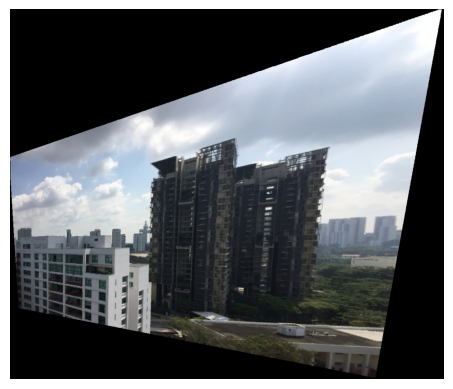

In [149]:
plt.imshow(cv2.cvtColor(i22i1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

480 640
(1015, 1481, 3)
y_start 0 x_start 400
y_end 640 x_end 880


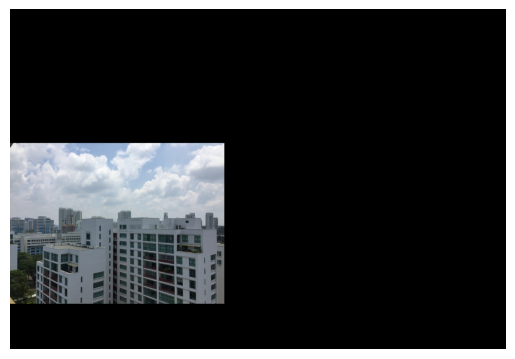

In [152]:
def expand_image(img, min_x, min_y, max_x, max_y):
    """
    Args:
        img (numpy.ndarray): Input image.
        min_x (int): Minimum x-coordinate (may be negative).
        min_y (int): Minimum y-coordinate (may be negative).
        max_x (int): Maximum x-coordinate.
        max_y (int): Maximum y-coordinate.

    Returns:
        numpy.ndarray: Expanded image with black-filled area.
    """
    # Get the original image dimensions
    img_height, img_width = img.shape[0], img.shape[1]
    print(img_height, img_width)

    # Determine the new dimensions
    new_height = max(max_x, img_height)
    new_width = max(max_y, img_width)

    if min_y < 0:
        new_width -= min_y
    if min_x < 0:
        new_height -= min_x

    # Create an empty expanded image with black color
    expanded_img = np.zeros((new_height+5, new_width+5, img.shape[2]), dtype=np.uint8)
    print(expanded_img.shape)
    # Calculate the region where the original image will be placed
    x_start = max(0, -min_x)
    y_start = max(0, -min_y)
    print('y_start', y_start, 'x_start', x_start)

    x_end = x_start + img_height
    y_end = y_start + img_width
    print('y_end', y_end, 'x_end', x_end)
    # Place the original image in the expanded image
    #print(x_start-x_end, y_start-y_end)
    #print(img.shape)
    expanded_img[x_start:x_end, y_start:y_end] = img

    return expanded_img
    
expended_image1 = expand_image(img1, min_x, min_y, max_x, max_y)
plt.imshow(cv2.cvtColor(expended_image1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

-400 292 610 1476
(1014, 1188)


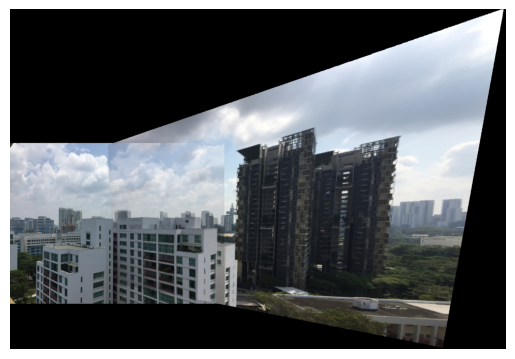

In [153]:
mask = i22i1[:, :, 0] != 0
print(min_x, min_y, max_x, max_y)
print(mask.shape)
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            if np.all(expended_image1[x, y+min_y] == 0):
                expended_image1[x, y+min_y] = i22i1[x, y]
            else:
                expended_image1[x, y+min_y] = expended_image1[x, y+min_y]/2 + i22i1[x, y]/2

plt.imshow(cv2.cvtColor(expended_image1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

num_points 229
img.shape (480, 640, 3)
corner [[  0   0 480 480]
 [  0 640   0 640]
 [  1   1   1   1]]
maxcorner 1694.5579739966754 -1195.0964877293607 4517.709632245301 447.5311291567164
row_number 480 collum_number 640


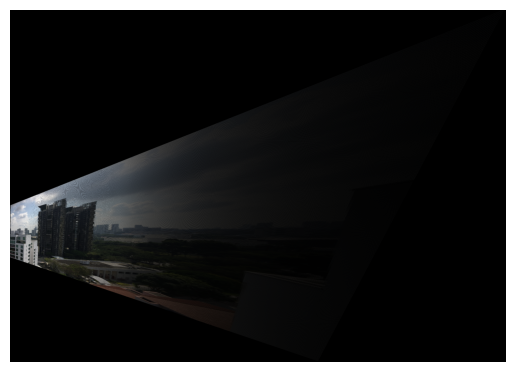

In [166]:
img3 = cv2.imread('assg1/im03.jpg')
img4 = cv2.imread('assg1/im04.jpg')

sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(expended_image1, None)
kp2, des2 = sift.detectAndCompute(img3, None)

matches = mini_square(des1, des2)
good_matches = []
for m in matches:
    first, second = matches[m.queryIdx], matches[m.trainIdx]
    if first.distance < 0.5 * second.distance:
        good_matches.append(first)

# # Draw matches on the images
# matched_img = cv2.drawMatches(expended_image1, kp1, img3, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# # Show the matched image
# plt.figure(figsize=(12, 6))
# plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
# plt.title('SIFT Keypoint Matches')
# plt.axis('off')
# plt.show()
        
src_points = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
dst_points = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
src_points[:, [0, 1]] = src_points[:, [1, 0]]
dst_points[:, [0, 1]] = dst_points[:, [1, 0]]

H3, _ = getH(src_points, dst_points)

i32i1, min_x, min_y, max_x, max_y = transfer(img3, H3, 0.2)

plt.imshow(cv2.cvtColor(i32i1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

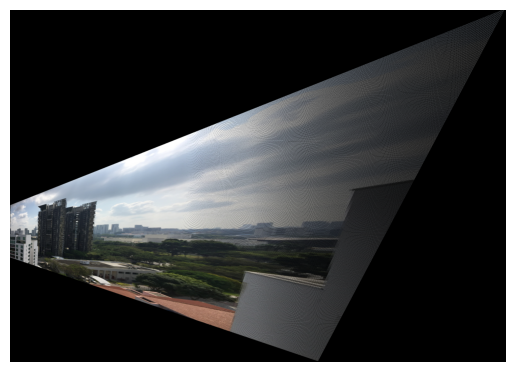

In [167]:
i32i1 = replace_black_pixels_with_mean(i32i1)

plt.imshow(cv2.cvtColor(i32i1, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

1015 1481
(2895, 4523, 3)
y_start 0 x_start 1195
y_end 1481 x_end 2210
-1195 448 1695 4518
(2894, 4075)


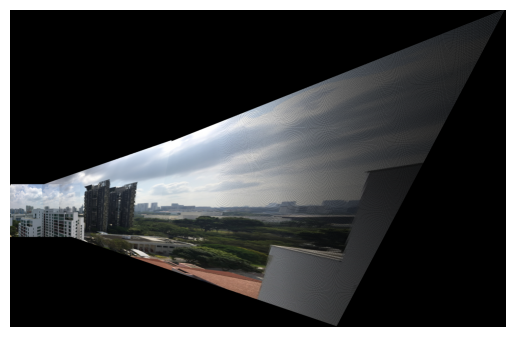

In [168]:
expended_image12 = expand_image(expended_image1, min_x, min_y, max_x, max_y)

mask = i32i1[:, :, 0] != 0
print(min_x, min_y, max_x, max_y)
print(mask.shape)
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            if np.all(expended_image12[x, y+min_y] == 0):
                expended_image12[x, y+min_y] = i32i1[x, y]
            else:
                expended_image12[x, y+min_y] = expended_image12[x, y+min_y]/2 + i32i1[x, y]/2

plt.imshow(cv2.cvtColor(expended_image12, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [170]:
output_path = 'assg1/im123.jpg'
cv2.imwrite(output_path, expended_image12)

True

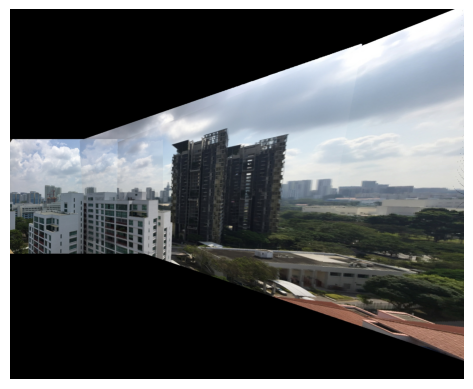

True

In [178]:
img123 = cv2.imread('assg1/im123.jpg')

left = 0
top = 1050   
right = 1900  
bottom = 2600 

img123 = img123[top:bottom, left:right]

plt.imshow(cv2.cvtColor(img123, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

output_path = 'assg1/im123_cut.jpg'
cv2.imwrite(output_path, img123)

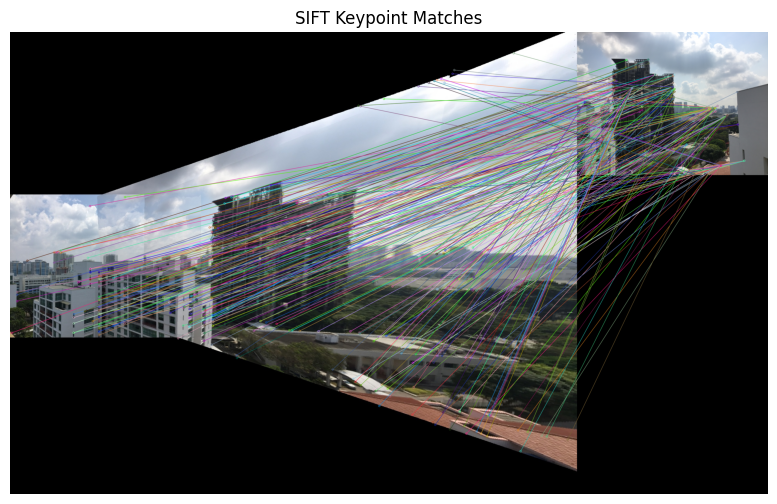

In [179]:
img123 = cv2.imread('assg1/im123_cut.jpg')

kp1, des1 = sift.detectAndCompute(img123, None)
kp2, des2 = sift.detectAndCompute(img4, None)

matches = mini_square(des1, des2)
good_matches = []
for m in matches:
    first, second = matches[m.queryIdx], matches[m.trainIdx]
    if first.distance < 0.5 * second.distance:
        good_matches.append(first)

# Draw matches on the images
matched_img = cv2.drawMatches(img123, kp1, img4, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Show the matched image
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(matched_img, cv2.COLOR_BGR2RGB))
plt.title('SIFT Keypoint Matches')
plt.axis('off')
plt.show()

num_points 287
H4 [[ 1.60406664e-03 -1.36611294e-03  6.81570063e-01]
 [ 1.18256269e-04  4.27346217e-04  7.31748451e-01]
 [ 2.90637535e-07 -1.83531728e-06  1.34810997e-03]]
img.shape (480, 640, 3)
corner [[  0   0 480 480]
 [  0 640   0 640]
 [  1   1   1   1]]
maxcorner 1844.044501782072 -1110.8618949101706 5793.717475979885 530.0504072928602
row_number 480 collum_number 640


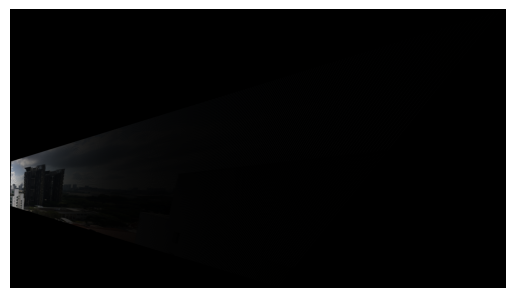

In [196]:
src_points = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 2)
dst_points = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 2)
src_points[:, [0, 1]] = src_points[:, [1, 0]]
dst_points[:, [0, 1]] = dst_points[:, [1, 0]]

H4, _ = getH(src_points, dst_points)
print('H4',H4)

def transfer(img, H, step):
    # Get output size
    max_x, min_x, max_y, min_y = new_homoed_size(img, H)
    print("maxcorner", max_x, min_x, max_y, min_y)
    delta_x, delta_y = max_x - min_x, max_y - min_y
    [row_number, collum_number, c] = img.shape
    print('row_number',row_number, 'collum_number', collum_number)
    
    # Initialize the output image 
    h12h2 = np.zeros([int(delta_x+5), int(delta_y+5), c], dtype=np.uint8)
    
    for r in np.arange(0, row_number, step):
        for c in np.arange(0, collum_number, step):
            px = np.array([[r, c, 1]]).T
            Tp = np.dot(H, px)
            
            # Normalize and move the image to the central
            x = int(round(Tp[0, 0] / Tp[2, 0] - min_x))
            y = int(round(Tp[1, 0] / Tp[2, 0] - min_y))
            r = int(round(r))
            c = int(round(c))
            if r == img.shape[0]:
                r = r-1
            if c == img.shape[1]:
                c = c-1
            h12h2[x, y] = img[r, c]

    return h12h2, round(min_x), round(min_y), round(max_x), round(max_y)

i42i123, min_x, min_y, max_x, max_y = transfer(img4, H4, 1)

plt.imshow(cv2.cvtColor(i42i123, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

img.shape (480, 640, 3)
corner [[  0   0 480 480]
 [  0 640   0 640]
 [  1   1   1   1]]
maxcorner 1844.044501782072 -1110.8618949101706 5793.717475979885 530.0504072928602
row_number 480 collum_number 640


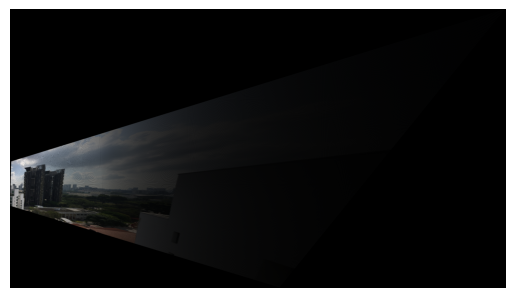

In [198]:
i42i123, min_x, min_y, max_x, max_y = transfer(img4, H4, 0.2)

plt.imshow(cv2.cvtColor(i42i123, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

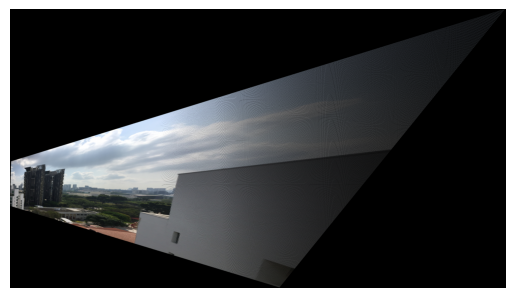

In [199]:
i42i123 = replace_black_pixels_with_mean(i42i123)

plt.imshow(cv2.cvtColor(i42i123, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

1550 1900
(2960, 5799, 3)
y_start 0 x_start 1111
y_end 1900 x_end 2661
-1111 530 1844 5794
(2959, 5268)


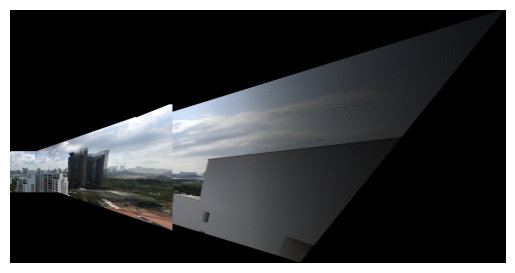

In [200]:
expended_image123 = expand_image(img123, min_x, min_y, max_x, max_y)

mask = i42i123[:, :, 0] != 0
print(min_x, min_y, max_x, max_y)
print(mask.shape)
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            if np.all(expended_image123[x, y+min_y] == 0):
                expended_image123[x, y+min_y] = i42i123[x, y]
            else:
                expended_image123[x, y+min_y] = expended_image123[x, y+min_y]/2 + i42i123[x, y]/2

plt.imshow(cv2.cvtColor(expended_image123, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

## Part 6: Advanced Panoramic Image

### Handling unordered images
Pictures are from the Internet

In [288]:
import cv2
import numpy as np
import os

# 从文件夹中读取所有jpg图像
image_folder = 'demo'
image_files = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

# 初始化SIFT检测器
sift = cv2.SIFT_create()

# 计算所有图像的SIFT特征
keypoints = []
descriptors = []

for image_file in image_files:
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    kp, des = sift.detectAndCompute(gray, None)
    keypoints.append(kp)
    descriptors.append(des)

# 找到最适合拼接的两张图像
best_match = None
best_match_score = 0

for i in range(len(image_files)):
    for j in range(i+1, len(image_files)):
        # 进行特征点匹配
        # 根据匹配的数量或其他相似性指标评估两张图片的拼接质量
        # matcher = cv2.FlannBasedMatcher(dict(algorithm=0, trees=5), {})
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(descriptors[i], descriptors[j], k=2)

        good_matches = []
        for m, n in matches:
            if m.distance < 0.5 * n.distance:
                good_matches.append(m)

        # 在这里，您可以使用匹配的数量、相似性分数等来评估拼接质量
        match_score = len(good_matches)
        
        if match_score > best_match_score:
            best_match = (i, j)
            best_match_score = match_score

print(best_match)

(2, 3)


(1360, 2048, 3)


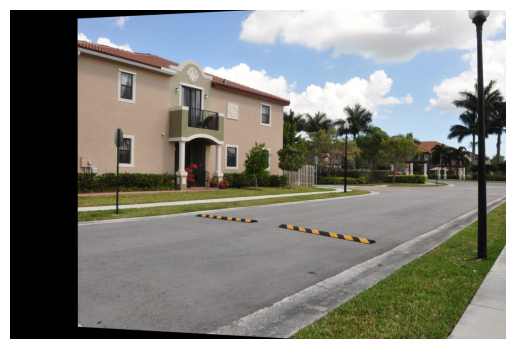

In [289]:
# 使用OpenCV的图像拼接函数将最佳匹配的两张图像拼接在一起
image1 = cv2.imread(os.path.join(image_folder, image_files[best_match[0]]))
image2 = cv2.imread(os.path.join(image_folder, image_files[best_match[1]]))

# 使用SIFT特征点匹配计算Homography
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(image1, None)
keypoints2, descriptors2 = sift.detectAndCompute(image2, None)

# 使用FLANN匹配器或暴力匹配器进行特征点匹配
# matcher = cv2.FlannBasedMatcher(dict(algorithm=0, trees=5), {})
bf = cv2.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# 检查匹配的特征点是否足够
if len(good_matches) >= 4:
    src_points = np.array([keypoints1[match.queryIdx].pt for match in good_matches])
    dst_points = np.array([keypoints2[match.trainIdx].pt for match in good_matches])

    # 使用RANSAC算法估算Homography矩阵
    H, _ = cv2.findHomography(src_points, dst_points, cv2.RANSAC)

    

    # 使用H矩阵将源图像映射到目标图像中
    outputImage = cv2.warpPerspective(image1, H, (image2.shape[1], image2.shape[0]))
    print(outputImage.shape)
    
    # 创建一个画布，大小与目标图像相同
    canvas = np.copy(image2)
    
    # 在画布上将映射后的图像放置在适当的位置
    canvas[0:outputImage.shape[0], 0:outputImage.shape[1]] = outputImage

    plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()
else:
    print("Not enough matching points for stitching.")

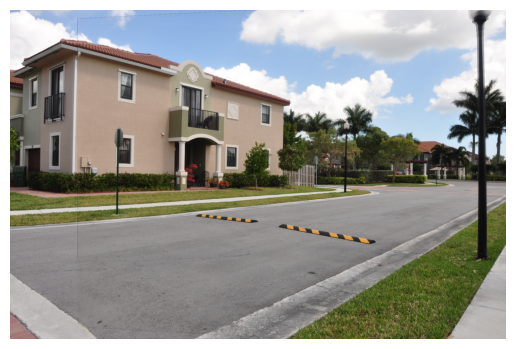

In [262]:
mask = canvas[:, :, 0] != 0
heightS, widthS = mask.shape
for x in range(heightS):
    for y in range(widthS):
        if mask[x,y]:
            canvas[x, y] = canvas[x, y]/2 + image2[x, y]/2
        else:
            canvas[x, y] = image2[x, y]

plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

<mark> Randomly input a set of pictures, match the every two pictures, and evaluate the splicing quality of the two pictures based on the number of matches or other similarity indicators. Select the two images with the highest scores for matching. Then just add the new image into the collection, move the already used image out of the collection, and repeat the above operations. Finally, you can get the restored panorama from the random image.  <mark>

In [338]:
# # 使用SIFT特征点匹配计算Homography
# sift = cv2.SIFT_create()
# keypoints1, descriptors1 = sift.detectAndCompute(image1, None)
# keypoints2, descriptors2 = sift.detectAndCompute(image2, None)

# # 使用FLANN匹配器或暴力匹配器进行特征点匹配
# bf = cv2.BFMatcher()
# matches = bf.knnMatch(descriptors1, descriptors2, k=2)

# good_matches = []
# for m, n in matches:
#     if m.distance < 0.7 * n.distance:
#         good_matches.append(m)

# # 检查匹配的特征点是否足够
# if len(good_matches) >= 4:
#     src_points = np.float32([keypoints1[match.queryIdx].pt for match in good_matches]).reshape(-1, 1, 2)
#     dst_points = np.float32([keypoints2[match.trainIdx].pt for match in good_matches]).reshape(-1, 1, 2)
    
#     # 使用RANSAC算法估算Homography矩阵 # from src to dst
#     H, _ = cv2.findHomography(src_points, dst_points, cv2.RANSAC)

#     # 获取image1的尺寸
#     h1, w1 = image1.shape[:2]
#     #print(h1, w1)
#     h2, w2 = image2.shape[:2]
#     print(h2, w2)

#     # 计算原图像的四个顶点的坐标
#     corner_pts1 = np.array([[0, 0], [0, h1], [w1, 0], [w1, h1]], dtype=np.float32).reshape(-1, 1, 2)

#     # 使用H矩阵将原图像的四个顶点映射到image2中
#     corner_pts2 = cv2.perspectiveTransform(corner_pts1, H)
#     #print(corner_pts2)
#     corner_pts2 = corner_pts2.reshape(4,2)
#     #print(corner_pts2)

#     # 找到映射后的图像的四个顶点的坐标
#     min_x, min_y = np.min(corner_pts2[:, 0]), np.min(corner_pts2[:, 1])
#     max_x, max_y = np.max(corner_pts2[:, 0]), np.max(corner_pts2[:, 1])
#     print('max_x, min_x, max_y, min_y', max_x, min_x, max_y, min_y)
    
#     # 计算拼接后画布的尺寸  
#     canvas_width = 0
#     canvas_height = 0
  
#     if min_x<0:
#         canvas_width -= min_x
#     if min_y<0:
#         canvas_height -= min_y
#     canvas_width += np.max([max_x,w2])
#     canvas_height += np.max([max_y,h2])
#     canvas_width = int(canvas_width)+10
#     canvas_height = int(canvas_height)+10

#     print('canvas_width, canvas_height', canvas_width, canvas_height)

#     # 创建一个空白画布，大小为拼接后的尺寸
#     canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)
#     print('canvas.shape', canvas.shape)

#     # 计算图像1在画布上的位置
#     x_offset = int(np.round(max([0,min_x])))
#     y_offset = int(np.round(max([0,min_y])))
#     print('x_offset,y_offset',x_offset,y_offset)

#     # 使用H矩阵将image1映射到image2上
#     traned_width = int(np.round(max_x+np.abs(min_x)))
#     traned_height = int(np.round(max_y+np.abs(min_y)))
#     print('traned_width,traned_height',traned_width,traned_height)
    
#     outputImage = cv2.warpPerspective(image1, H, (traned_width, traned_height))
#     print('outputImage.shape',outputImage.shape)
#     y_end = int(np.round(y_offset+max_y-min_y))
#     x_end = int(np.round(x_offset+max_x-min_x))
#     print('y_offset,y_end,x_offset,x_end',y_offset,y_end,x_offset,x_end)
#     #print(canvas[y_offset:y_end, x_offset:x_end].shape)

#     print('y_offset,canvas_height,x_offset,canvas_width',y_offset,canvas_height,x_offset,canvas_width)
#     print('outputImage.shape[0],outputImage.shape[1]',outputImage.shape[0],outputImage.shape[1])
#     # 将映射后的图像放置在画布上的适当位置
#     #canvas[y_offset:y_end,x_offset:x_end] = outputImage
# else:
#     print("Not enough matching points for stitching.")

# plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB))
# plt.axis('off')
# plt.show()

# plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
# plt.axis('off')
# plt.show()

# plt.imshow(cv2.cvtColor(outputImage, cv2.COLOR_BGR2RGB))
# plt.axis('off')
# plt.show()

In [339]:
# heightS, widthS,_ = image2.shape

# # for x in range(heightS):
# #     for y in range(widthS):
# #         pixel1 = canvas[x, y]
# #         pixel2 = image2[x, x]

# #         # 如果两幅图像的像素都是黑色，则输出黑色
# #         if np.all(pixel1 == 0) and np.all(pixel2 == 0):
# #             result[x, y] = [0, 0, 0]
# #         else:
# #             # 否则，计算像素的平均值
# #             result[x, y] = (pixel1/2 + pixel2/2)

# for x in range(heightS):
#     for y in range(widthS):
#         if np.all(image2[x, y]!=0) and np.all(canvas[x, y] == 0):
#             canvas[x, y] = image2[x, y]
#         else :
#             if np.all(image2[x, y]!=0) and np.all(canvas[x, y] != 0):
#                 canvas[x, y] = image2[x, y]/2 + canvas[x, y]/2

# plt.imshow(cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB))
# plt.axis('off')
# plt.show()